In [150]:
import numpy as np 
import pandas as pd 
import tensorflow as tf
from keras import optimizers
import matplotlib.pyplot as plt
from keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator
from matplotlib.pyplot import imshow
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam , RMSprop 
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau , EarlyStopping , ModelCheckpoint , LearningRateScheduler
from tensorflow.keras.applications import ResNet50V2

In [151]:
df = pd.read_csv('/kaggle/input/butterfly-images40-species/butterflies and moths.csv')  
IMAGE_DIR = '/kaggle/input/butterfly-images40-species'
df['filepaths'] = IMAGE_DIR + '/' + df['filepaths']
#df.head()
cates = list(df['labels'].unique())
print(cates)

['ADONIS', 'AFRICAN GIANT SWALLOWTAIL', 'AMERICAN SNOOT', 'AN 88', 'APPOLLO', 'ARCIGERA FLOWER MOTH', 'ATALA', 'ATLAS MOTH', 'BANDED ORANGE HELICONIAN', 'BANDED PEACOCK', 'BANDED TIGER MOTH', 'BECKERS WHITE', 'BIRD CHERRY ERMINE MOTH', 'BLACK HAIRSTREAK', 'BLUE MORPHO', 'BLUE SPOTTED CROW', 'BROOKES BIRDWING', 'BROWN ARGUS', 'BROWN SIPROETA', 'CABBAGE WHITE', 'CAIRNS BIRDWING', 'CHALK HILL BLUE', 'CHECQUERED SKIPPER', 'CHESTNUT', 'CINNABAR MOTH', 'CLEARWING MOTH', 'CLEOPATRA', 'CLODIUS PARNASSIAN', 'CLOUDED SULPHUR', 'COMET MOTH', 'COMMON BANDED AWL', 'COMMON WOOD-NYMPH', 'COPPER TAIL', 'CRECENT', 'CRIMSON PATCH', 'DANAID EGGFLY', 'EASTERN COMA', 'EASTERN DAPPLE WHITE', 'EASTERN PINE ELFIN', 'ELBOWED PIERROT', 'EMPEROR GUM MOTH', 'GARDEN TIGER MOTH', 'GIANT LEOPARD MOTH', 'GLITTERING SAPPHIRE', 'GOLD BANDED', 'GREAT EGGFLY', 'GREAT JAY', 'GREEN CELLED CATTLEHEART', 'GREEN HAIRSTREAK', 'GREY HAIRSTREAK', 'HERCULES MOTH', 'HUMMING BIRD HAWK MOTH', 'INDRA SWALLOW', 'IO MOTH', 'Iphiclus si

In [152]:
train_df = df.loc[df['data set'] == 'train']
val_df = df.loc[df['data set'] == 'valid']
test_df = df.loc[df['data set'] == 'test']
train_data = []
train_df.head()



,class id,filepaths,labels,data set
0,0,/kaggle/input/butterfly-images40-species/train...,ADONIS,train
1,0,/kaggle/input/butterfly-images40-species/train...,ADONIS,train
2,0,/kaggle/input/butterfly-images40-species/train...,ADONIS,train
3,0,/kaggle/input/butterfly-images40-species/train...,ADONIS,train
4,0,/kaggle/input/butterfly-images40-species/train...,ADONIS,train


In [153]:
path_train = IMAGE_DIR + '/' + 'train'
path_test = IMAGE_DIR + '/'+ 'test'
path_val = IMAGE_DIR + '/' + 'valid'
train_datagen = ImageDataGenerator(rescale=1. / 255)
train = train_datagen.flow_from_directory(path_train,
                                          target_size=(227,227),
                                          class_mode='categorical',
                                          classes = cates)
test = train_datagen.flow_from_directory(path_test,
                                         target_size=(227,227),
                                         class_mode='categorical',
                                         classes = cates)
val = train_datagen.flow_from_directory(path_val,
                                        target_size=(227,227),
                                        class_mode='categorical')

Found 12594 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 500 images belonging to 100 classes.


In [154]:
def AlexNet(input_shape):
    
    X_input = Input(input_shape)
    
    X = Conv2D(96,(11,11),strides = 4,name="conv0")(X_input)
    X = BatchNormalization(axis = 3 , name = "bn0")(X)
    X = Activation('relu')(X)
    
    X = MaxPooling2D((3,3),strides = 2,name = 'max0')(X)
    
    X = Conv2D(256,(5,5),padding = 'same' , name = 'conv1')(X)
    X = BatchNormalization(axis = 3 ,name='bn1')(X)
    X = Activation('relu')(X)
    
    X = MaxPooling2D((3,3),strides = 2,name = 'max1')(X)
    
    X = Conv2D(384, (3,3) , padding = 'same' , name='conv2')(X)
    X = BatchNormalization(axis = 3, name = 'bn2')(X)
    X = Activation('relu')(X)
    
    X = Conv2D(384, (3,3) , padding = 'same' , name='conv3')(X)
    X = BatchNormalization(axis = 3, name = 'bn3')(X)
    X = Activation('relu')(X)
    
    X = Conv2D(256, (3,3) , padding = 'same' , name='conv4')(X)
    X = BatchNormalization(axis = 3, name = 'bn4')(X)
    X = Activation('relu')(X)
    
    X = MaxPooling2D((3,3),strides = 2,name = 'max2')(X)
    
    X = Flatten()(X)
    
    X = Dense(4096, activation = 'relu', name = "fc0")(X)
    
    X = Dense(4096, activation = 'relu', name = 'fc1')(X) 
    
    X = Dense(100,activation='softmax',name = 'fc2')(X)
    
    model = Model(inputs = X_input, outputs = X, name='AlexNet')
    return model

In [155]:
model = AlexNet(train[0][0].shape[1:])
model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics=['accuracy'])
model.summary()

Model: "AlexNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 227, 227, 3)]     0         
                                                                 
 conv0 (Conv2D)              (None, 55, 55, 96)        34944     
                                                                 
 bn0 (BatchNormalization)    (None, 55, 55, 96)        384       
                                                                 
 activation_70 (Activation)  (None, 55, 55, 96)        0         
                                                                 
 max0 (MaxPooling2D)         (None, 27, 27, 96)        0         
                                                                 
 conv1 (Conv2D)              (None, 27, 27, 256)       614656    
                                                                 
 bn1 (BatchNormalization)    (None, 27, 27, 256)       1024

In [156]:
model.fit(train,epochs=20)

Epoch 1/20
394/394 [==============================] - 41s 93ms/step - loss: 5.0507 - accuracy: 0.0583
Epoch 2/20
394/394 [==============================] - 37s 93ms/step - loss: 3.1769 - accuracy: 0.1725
Epoch 3/20
394/394 [==============================] - 37s 93ms/step - loss: 2.6696 - accuracy: 0.2703
Epoch 4/20
394/394 [==============================] - 36s 92ms/step - loss: 2.2634 - accuracy: 0.3737
Epoch 5/20
394/394 [==============================] - 37s 95ms/step - loss: 2.0166 - accuracy: 0.4266
Epoch 6/20
394/394 [==============================] - 39s 100ms/step - loss: 1.7741 - accuracy: 0.4925
Epoch 7/20
394/394 [==============================] - 36s 90ms/step - loss: 1.5905 - accuracy: 0.5434
Epoch 8/20
394/394 [==============================] - 35s 88ms/step - loss: 1.4208 - accuracy: 0.5800
Epoch 9/20
394/394 [==============================] - 36s 90ms/step - loss: 1.2768 - accuracy: 0.6231
Epoch 10/20
394/394 [==============================] - 34s 87ms/step - loss: 1.16

1/1 [==============================] - 0s 157ms/step
GREEN CELLED CATTLEHEART
BROOKES BIRDWING


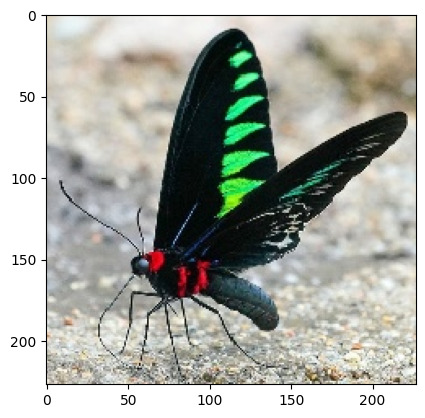

1/1 [==============================] - 0s 34ms/step
YELLOW SWALLOW TAIL
YELLOW SWALLOW TAIL


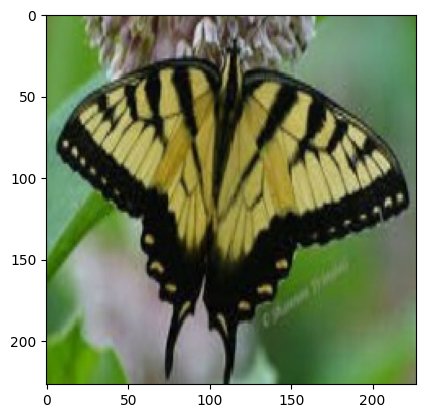

1/1 [==============================] - 0s 34ms/step
CABBAGE WHITE
CABBAGE WHITE


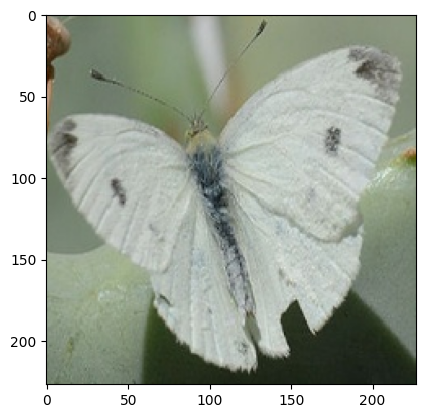

1/1 [==============================] - 0s 31ms/step
EASTERN DAPPLE WHITE
LARGE MARBLE


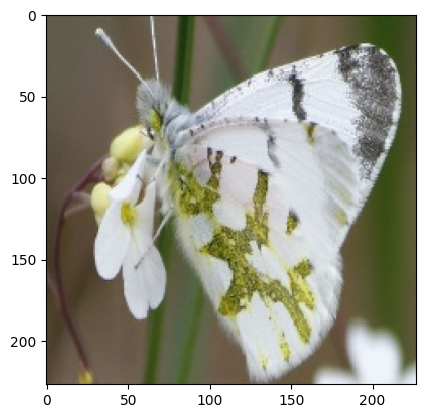

1/1 [==============================] - 0s 41ms/step
OLEANDER HAWK MOTH
WHITE LINED SPHINX MOTH


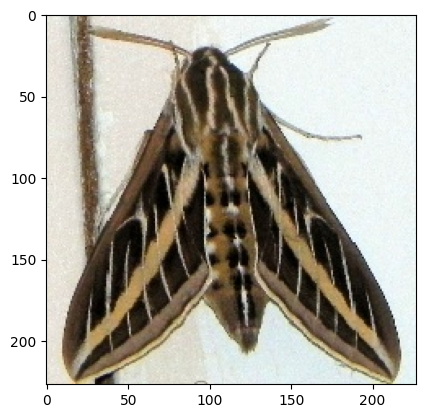

1/1 [==============================] - 0s 32ms/step
RED CRACKER
RED CRACKER


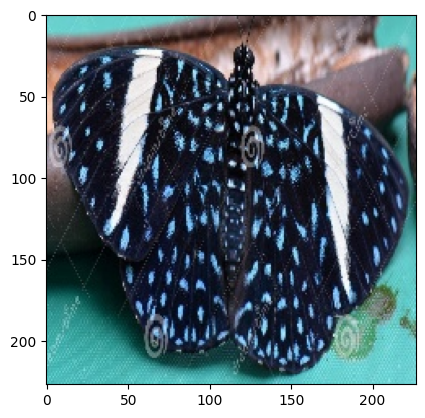

1/1 [==============================] - 0s 32ms/step
PAINTED LADY
PAINTED LADY


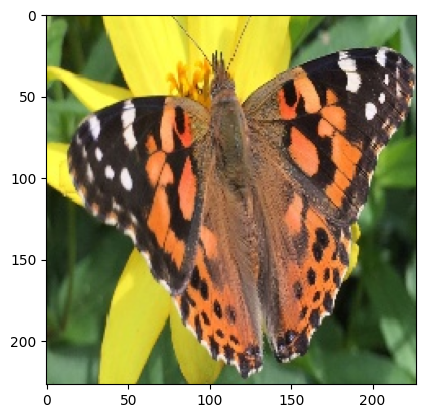

1/1 [==============================] - 0s 39ms/step
PIPEVINE SWALLOW
PIPEVINE SWALLOW


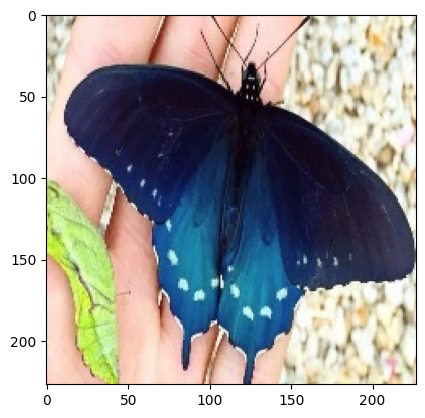

1/1 [==============================] - 0s 40ms/step
AN 88
AN 88


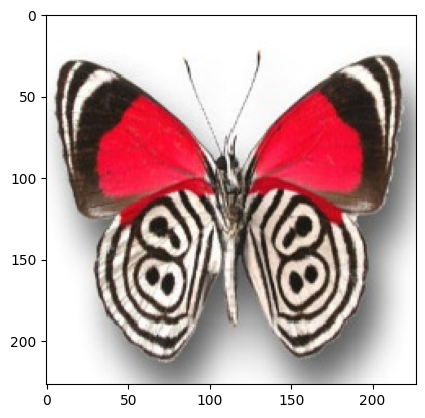

1/1 [==============================] - 0s 33ms/step
SLEEPY ORANGE
CLEOPATRA


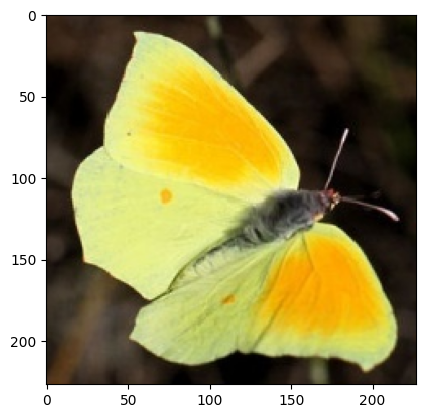

1/1 [==============================] - 0s 30ms/step
PURPLE HAIRSTREAK
GREY HAIRSTREAK


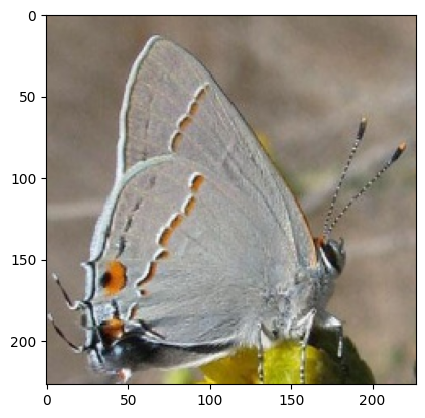

1/1 [==============================] - 0s 29ms/step
COPPER TAIL
BLACK HAIRSTREAK


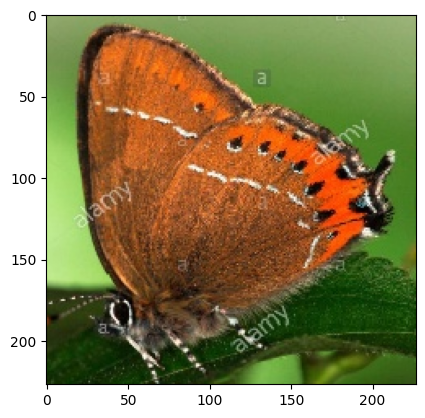

1/1 [==============================] - 0s 41ms/step
RED POSTMAN
RED POSTMAN


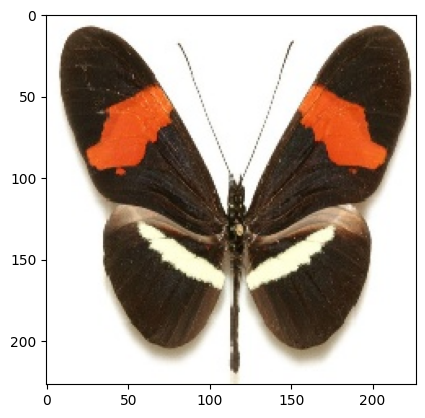

1/1 [==============================] - 0s 41ms/step
RED SPOTTED PURPLE
RED SPOTTED PURPLE


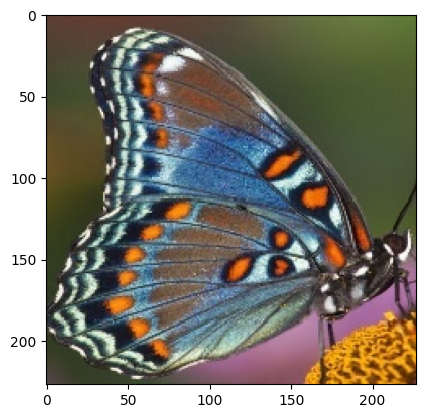

1/1 [==============================] - 0s 37ms/step
MILBERTS TORTOISESHELL
MILBERTS TORTOISESHELL


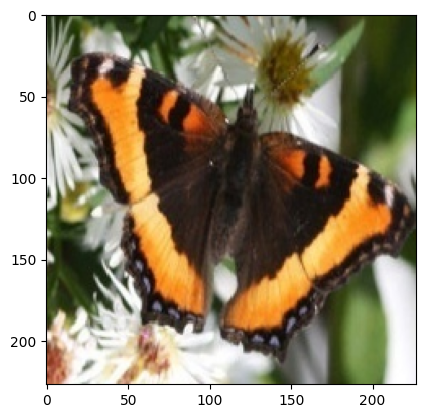

1/1 [==============================] - 0s 148ms/step
CLOUDED SULPHUR
CLOUDED SULPHUR


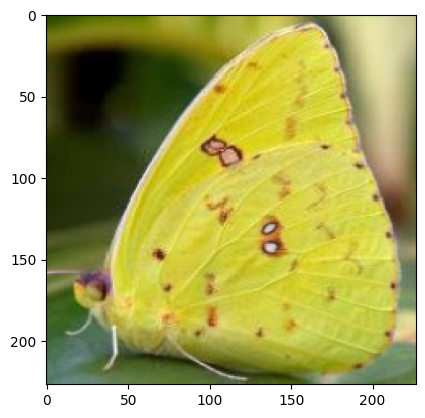

1/1 [==============================] - 0s 31ms/step
MONARCH
MONARCH


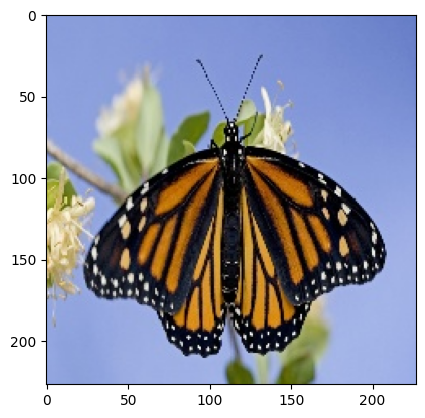

1/1 [==============================] - 0s 32ms/step
POPINJAY
POPINJAY


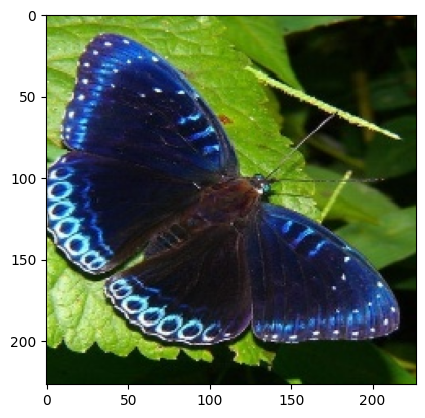

1/1 [==============================] - 0s 29ms/step
RED SPOTTED PURPLE
RED SPOTTED PURPLE


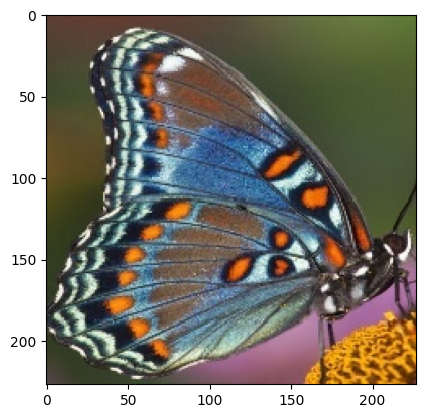

1/1 [==============================] - 0s 29ms/step
AFRICAN GIANT SWALLOWTAIL
AFRICAN GIANT SWALLOWTAIL


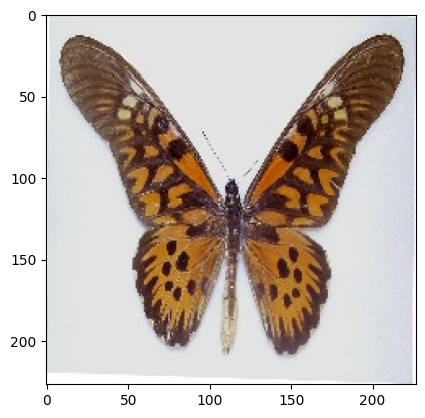

1/1 [==============================] - 0s 32ms/step
JULIA
JULIA


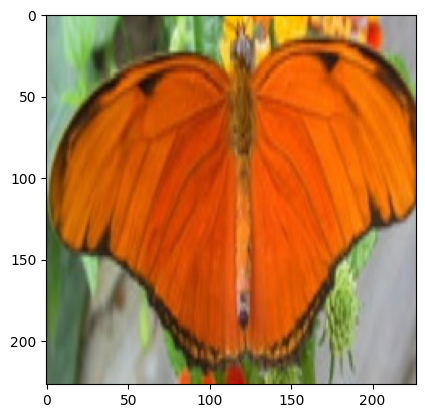

1/1 [==============================] - 0s 38ms/step
GREEN HAIRSTREAK
GREEN HAIRSTREAK


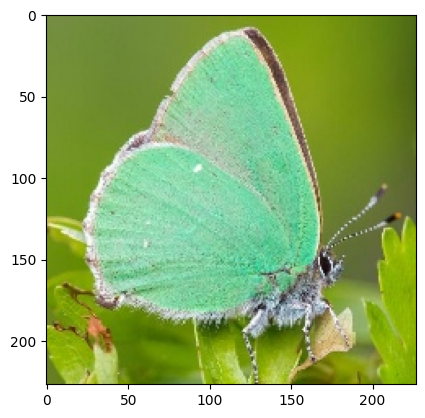

1/1 [==============================] - 0s 30ms/step
BLACK HAIRSTREAK
ROSY MAPLE MOTH


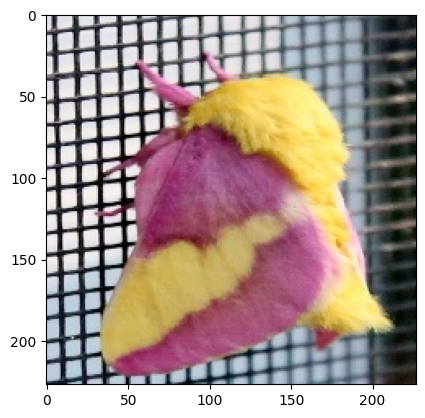

1/1 [==============================] - 0s 28ms/step
MALACHITE
BANDED TIGER MOTH


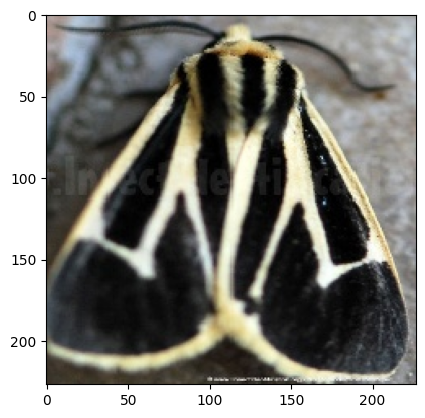

1/1 [==============================] - 0s 29ms/step
BROOKES BIRDWING
BLUE SPOTTED CROW


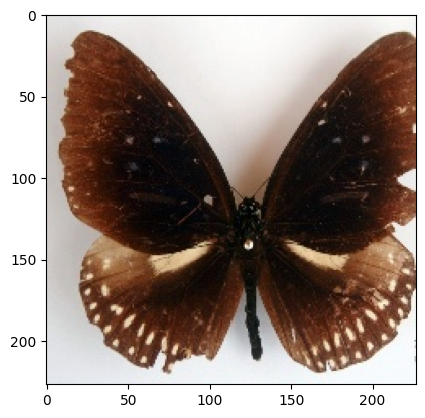

1/1 [==============================] - 0s 31ms/step
MOURNING CLOAK
MOURNING CLOAK


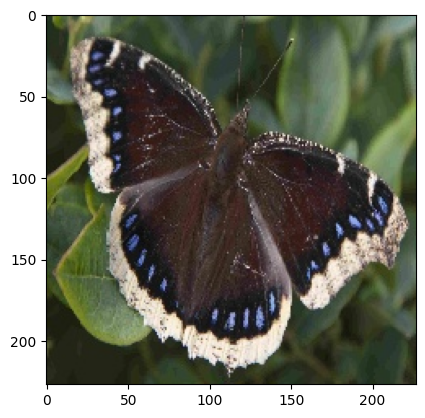

1/1 [==============================] - 0s 32ms/step
PAPER KITE
PAPER KITE


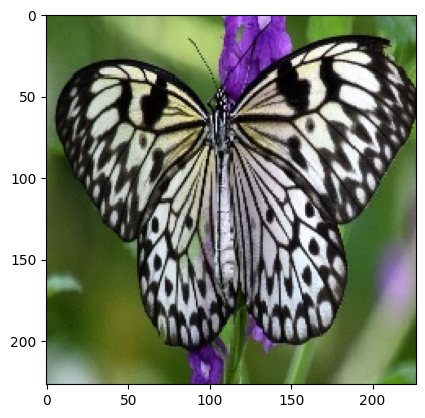

1/1 [==============================] - 0s 33ms/step
MALACHITE
PINE WHITE


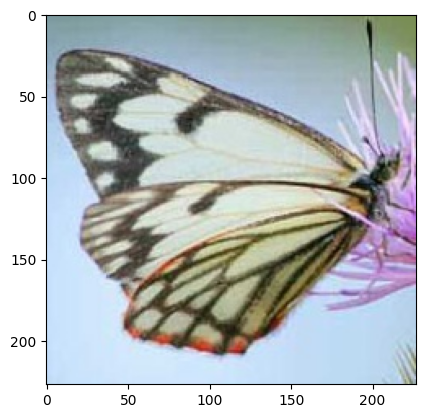

1/1 [==============================] - 0s 33ms/step
ADONIS
ADONIS


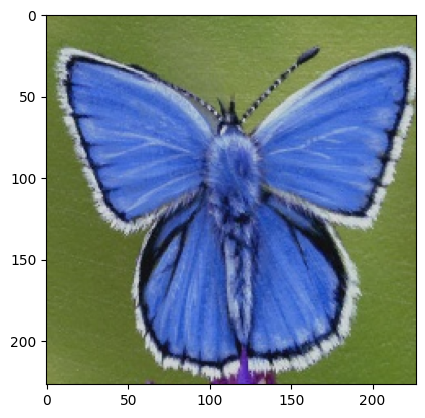

1/1 [==============================] - 0s 34ms/step
CAIRNS BIRDWING
LUNA MOTH


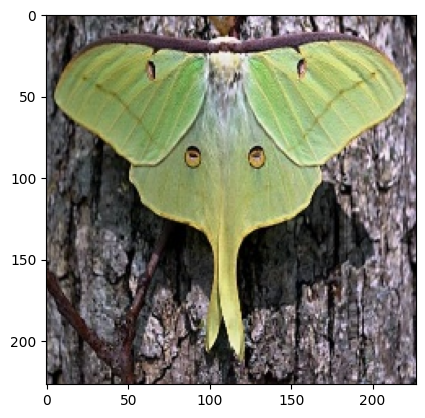

1/1 [==============================] - 0s 33ms/step
ATLAS MOTH
ATLAS MOTH


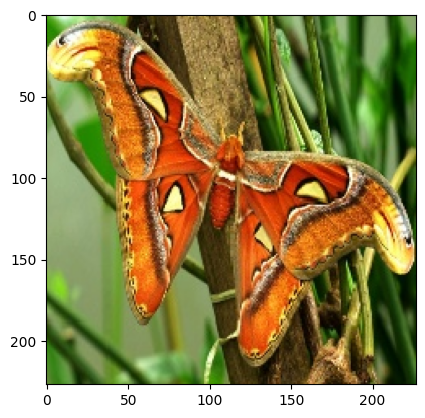

1/1 [==============================] - 0s 29ms/step
BLACK HAIRSTREAK
BLACK HAIRSTREAK


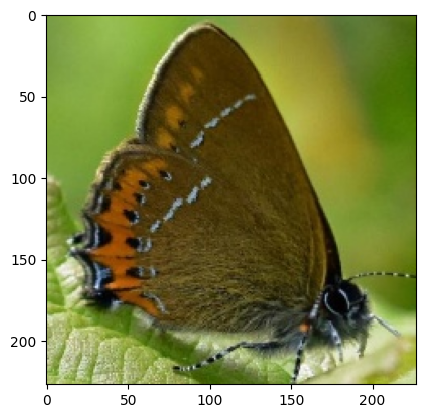

1/1 [==============================] - 0s 34ms/step
OLEANDER HAWK MOTH
CLEARWING MOTH


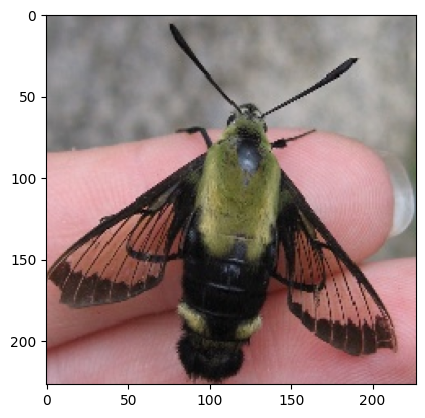

1/1 [==============================] - 0s 33ms/step
SLEEPY ORANGE
STRAITED QUEEN


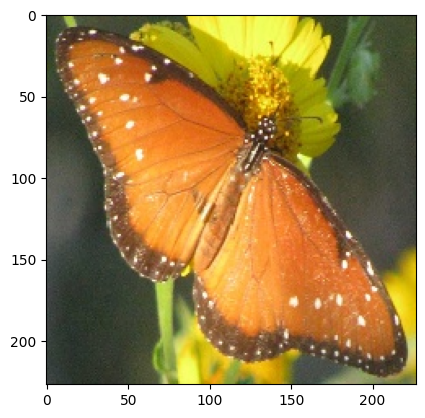

1/1 [==============================] - 0s 35ms/step
PURPLE HAIRSTREAK
ORANGE OAKLEAF


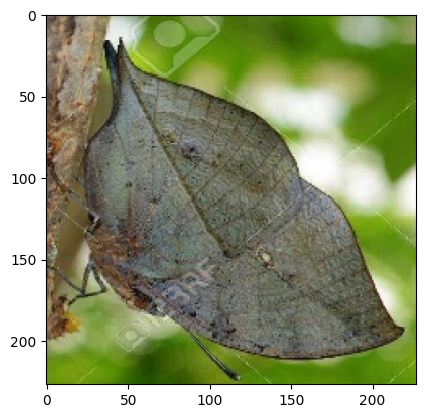

1/1 [==============================] - 0s 32ms/step
CHECQUERED SKIPPER
CHECQUERED SKIPPER


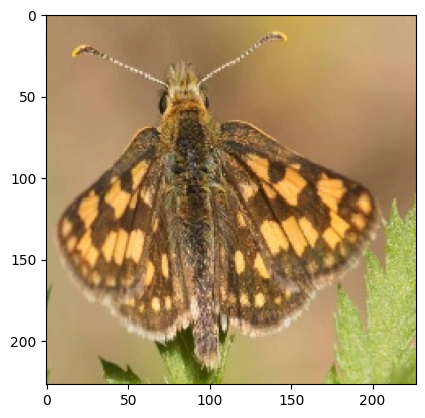

1/1 [==============================] - 0s 33ms/step
IO MOTH
IO MOTH


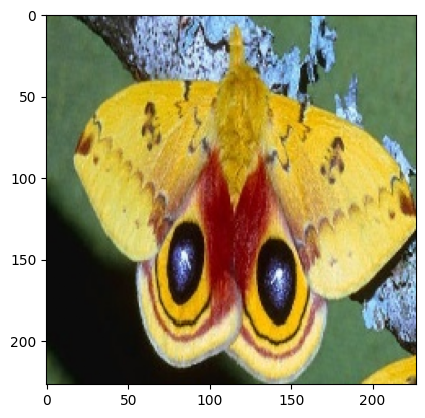

1/1 [==============================] - 0s 33ms/step
POPINJAY
POPINJAY


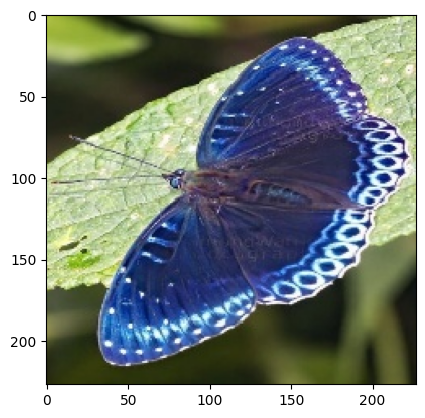

1/1 [==============================] - 0s 35ms/step
MOURNING CLOAK
ARCIGERA FLOWER MOTH


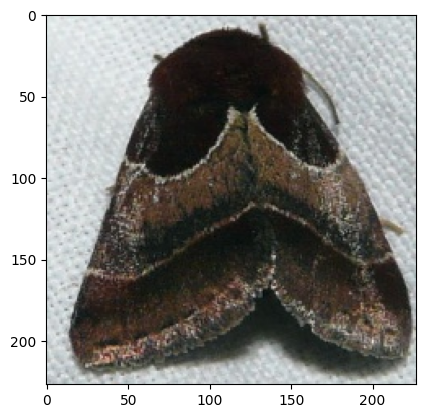

1/1 [==============================] - 0s 35ms/step
SLEEPY ORANGE
SLEEPY ORANGE


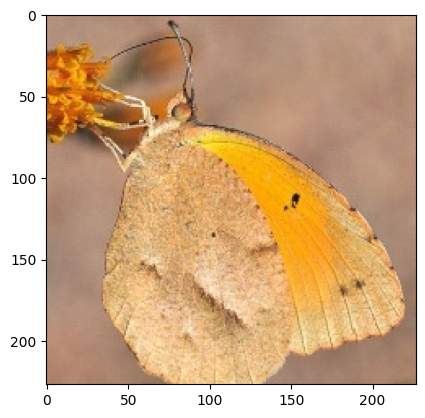

1/1 [==============================] - 0s 32ms/step
RED ADMIRAL
RED ADMIRAL


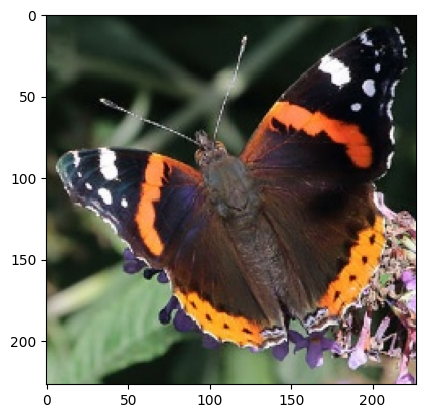

1/1 [==============================] - 0s 32ms/step
BLUE SPOTTED CROW
BLUE SPOTTED CROW


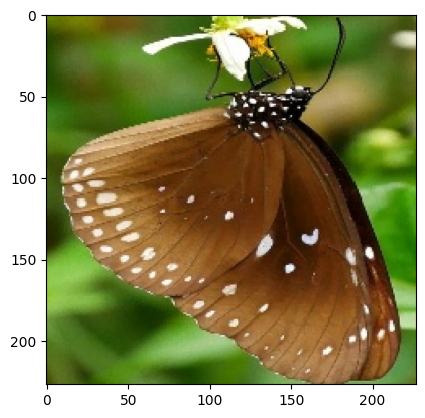

1/1 [==============================] - 0s 31ms/step
CLODIUS PARNASSIAN
CLODIUS PARNASSIAN


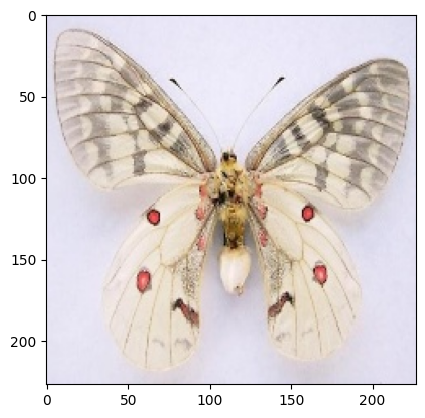

1/1 [==============================] - 0s 31ms/step
CLEARWING MOTH
ROSY MAPLE MOTH


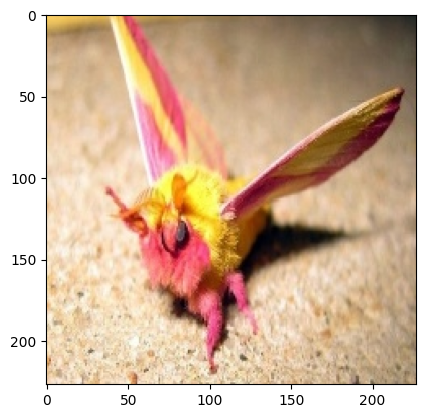

1/1 [==============================] - 0s 31ms/step
ORANGE TIP
ORANGE TIP


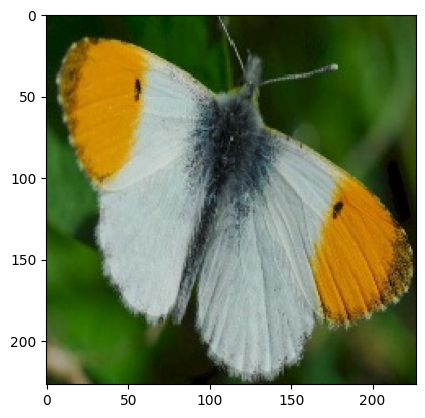

1/1 [==============================] - 0s 31ms/step
MOURNING CLOAK
MOURNING CLOAK


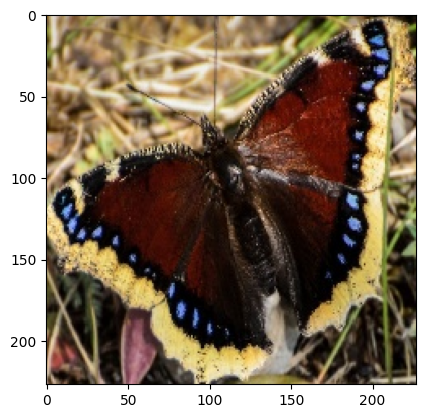

1/1 [==============================] - 0s 31ms/step
EASTERN DAPPLE WHITE
PINE WHITE


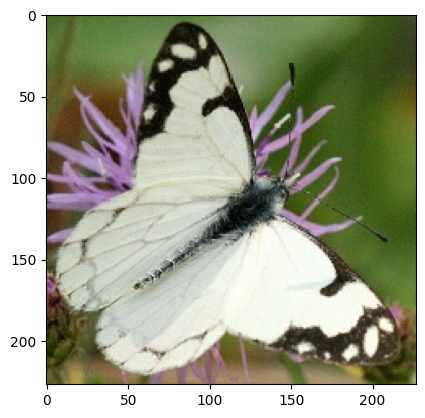

1/1 [==============================] - 0s 27ms/step
PAPER KITE
PAPER KITE


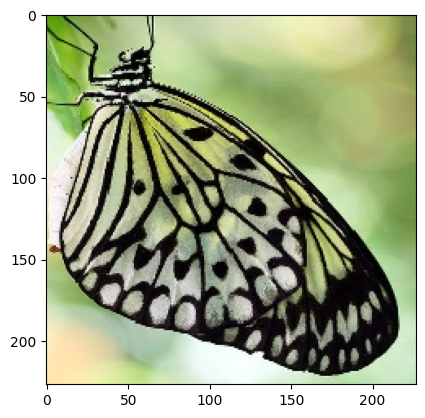

1/1 [==============================] - 0s 32ms/step
EASTERN DAPPLE WHITE
BECKERS WHITE


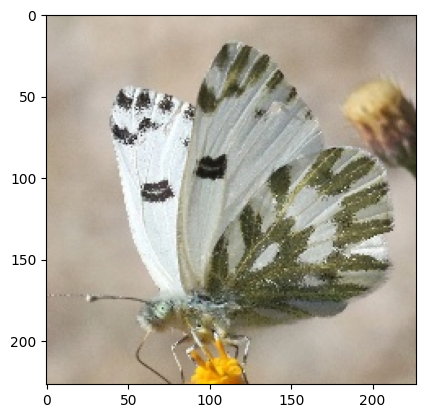

1/1 [==============================] - 0s 30ms/step
PEACOCK
RED CRACKER


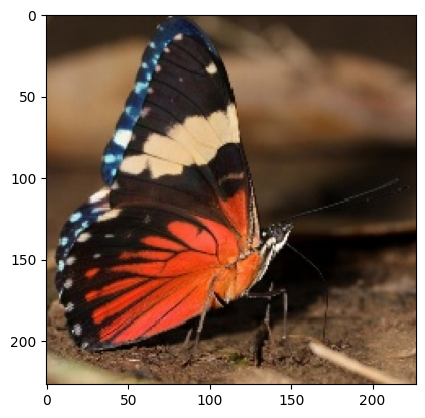

In [157]:
for i in range(50):
    temp=test.next()
    prediction = model.predict(temp[0])
    print(cates[np.argmax(prediction[0])])
    print(cates[np.argmax(temp[1])])
    plt.imshow(temp[0][0])
    plt.show()

In [158]:
model.evaluate(val)

16/16 [==============================] - 2s 88ms/step - loss: 1.0957 - accuracy: 0.7200


[1.0956597328186035, 0.7200000286102295]